In [3]:
# Dependecias del Notebook
import pandas as pd
import numpy as np
import pandas_datareader.data as data_web
import datetime as dt
import matplotlib.pyplot as plt
import plotly.express as px
import scipy
import yfinance as yf
from numpy.fft import fft, ifft

## Llamamos al histórico de la acción

In [65]:
df = yf.download('AAPL')['Adj Close']
df

[*********************100%***********************]  1 of 1 completed


Date
1980-12-12      0.100178
1980-12-15      0.094952
1980-12-16      0.087983
1980-12-17      0.090160
1980-12-18      0.092774
                 ...    
2022-06-15    135.429993
2022-06-16    130.059998
2022-06-17    131.559998
2022-06-21    135.869995
2022-06-22    135.699997
Name: Adj Close, Length: 10470, dtype: float64

In [66]:
fig = px.line(df)
fig.show()

## Aplicamos densidad espectral

array([5.69616287e+04, 2.99556104e+04, 1.78528534e+02, 7.70586207e+01,
       4.02698249e+01, 1.26061751e+01, 7.82765843e+00, 4.93214760e+00,
       1.59027808e+00, 3.64917908e+00, 5.91443317e+00, 1.12467384e+00,
       1.09970408e+00, 1.20864340e+00, 1.55987797e+00, 3.58724417e+00,
       2.38108817e+00, 1.11675607e+00, 1.38382457e+00, 9.58963075e-01,
       8.14236217e-01, 1.08505886e+00, 1.22988377e+00, 7.45715131e-01,
       3.92488704e-01, 6.08214526e-01, 2.92414375e-01, 2.22159302e-01,
       1.01950076e+00, 2.08197849e+00, 1.56372364e+00, 8.74414183e-01,
       5.55275321e-01, 3.65848849e-01, 2.41893234e-01, 1.75452244e-01,
       5.55565601e-02, 9.42049922e-02, 1.10434328e-01, 2.75546064e-01,
       2.14197564e-01, 1.53484384e-01, 1.35088646e-01, 3.92026954e-01,
       3.33091242e-01, 2.34056733e-01, 3.40074039e-01, 2.28806677e-01,
       8.80935399e-02, 1.85330324e-01, 1.04174185e-01, 4.90430450e-02,
       1.29869901e-01, 1.61613825e-01, 8.46994386e-02, 3.18797107e-01,
      

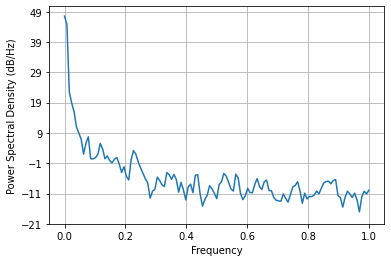

In [67]:
plt.psd(df)[0]

## Buscamos picos de manera "artesanal" xd

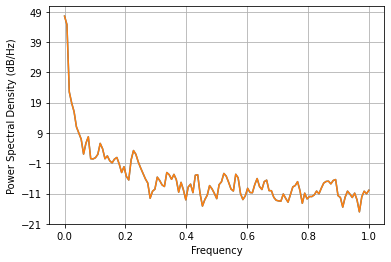

In [68]:
x_s = plt.psd(df)[1]
y_s = plt.psd(df)[0]

In [69]:
newy_s = y_s[(0.2<x_s)&(x_s<0.4)]

In [70]:
newx_s = x_s[(0.2<x_s)&(x_s<0.4)]


## Buscamos el valor x asociado al pico que hayamos escogido

In [71]:
matrix = []
for _ in range(newx_s.shape[0]):
    c = (newx_s[_], newy_s[_])
    matrix.append(c)
pd.DataFrame(matrix)   


,0,1
0,0.203125,0.292414
1,0.210938,0.222159
2,0.218750,1.019501
3,0.226562,2.081978
4,0.234375,1.563724
5,0.242188,0.874414
6,0.250000,0.555275
7,0.257812,0.365849
8,0.265625,0.241893
9,0.273438,0.175452


In [72]:
np.array(matrix[1:][1]).max()

1.0195007553186117

## Ventana de tiempo óptima para AAPL

In [73]:
1/0.226562

4.413802844254553

In [74]:
aapl = np.array(df)
(aapl.shape[0]/4)//1

2617.0

In [75]:
aapl_tset = []
for tao in (range(int(aapl.shape[0]/4)//1)):
    a = aapl[(4*tao)]
    aapl_tset.append(a)
aapl_tset
    

[0.10017842054367065,
 0.0927744060754776,
 0.11324519664049149,
 0.11890789866447449,
 0.10758325457572937,
 0.10627666115760803,
 0.11455174535512924,
 0.11411621421575546,
 0.10409900546073914,
 0.09974294155836105,
 0.0949520692229271,
 0.0910314992070198,
 0.08580511808395386,
 0.09233886748552322,
 0.09016042947769165,
 0.07535163313150406,
 0.08449854701757431,
 0.09320993721485138,
 0.08624069392681122,
 0.09190333634614944,
 0.09408100694417953,
 0.09712972491979599,
 0.09582313150167465,
 0.10017842054367065,
 0.09887182712554932,
 0.09669418632984161,
 0.0949520692229271,
 0.09582313150167465,
 0.10888984054327011,
 0.1154228076338768,
 0.11019644886255264,
 0.11455174535512924,
 0.10888984054327011,
 0.1032271683216095,
 0.09800078719854355,
 0.08667618036270142,
 0.07752924412488937,
 0.08711173385381699,
 0.0788358673453331,
 0.08406300097703934,
 0.08624069392681122,
 0.08798281103372574,
 0.08101433515548706,
 0.07448053359985352,
 0.06751205027103424,
 0.07012524455785

In [76]:
max(aapl_tset)

181.51170349121094

In [77]:
aapl_embedding = []
for i in range(len(aapl_tset)-1):
    point = (aapl_tset[i], aapl_tset[i+1])
    aapl_embedding.append(point)
aapl_embedding    

[(0.10017842054367065, 0.0927744060754776),
 (0.0927744060754776, 0.11324519664049149),
 (0.11324519664049149, 0.11890789866447449),
 (0.11890789866447449, 0.10758325457572937),
 (0.10758325457572937, 0.10627666115760803),
 (0.10627666115760803, 0.11455174535512924),
 (0.11455174535512924, 0.11411621421575546),
 (0.11411621421575546, 0.10409900546073914),
 (0.10409900546073914, 0.09974294155836105),
 (0.09974294155836105, 0.0949520692229271),
 (0.0949520692229271, 0.0910314992070198),
 (0.0910314992070198, 0.08580511808395386),
 (0.08580511808395386, 0.09233886748552322),
 (0.09233886748552322, 0.09016042947769165),
 (0.09016042947769165, 0.07535163313150406),
 (0.07535163313150406, 0.08449854701757431),
 (0.08449854701757431, 0.09320993721485138),
 (0.09320993721485138, 0.08624069392681122),
 (0.08624069392681122, 0.09190333634614944),
 (0.09190333634614944, 0.09408100694417953),
 (0.09408100694417953, 0.09712972491979599),
 (0.09712972491979599, 0.09582313150167465),
 (0.095823131501

In [78]:
X = []
for i in range(len(aapl_embedding)):
    x_ate = aapl_embedding[i][0]
    X.append(x_ate)
X    

[0.10017842054367065,
 0.0927744060754776,
 0.11324519664049149,
 0.11890789866447449,
 0.10758325457572937,
 0.10627666115760803,
 0.11455174535512924,
 0.11411621421575546,
 0.10409900546073914,
 0.09974294155836105,
 0.0949520692229271,
 0.0910314992070198,
 0.08580511808395386,
 0.09233886748552322,
 0.09016042947769165,
 0.07535163313150406,
 0.08449854701757431,
 0.09320993721485138,
 0.08624069392681122,
 0.09190333634614944,
 0.09408100694417953,
 0.09712972491979599,
 0.09582313150167465,
 0.10017842054367065,
 0.09887182712554932,
 0.09669418632984161,
 0.0949520692229271,
 0.09582313150167465,
 0.10888984054327011,
 0.1154228076338768,
 0.11019644886255264,
 0.11455174535512924,
 0.10888984054327011,
 0.1032271683216095,
 0.09800078719854355,
 0.08667618036270142,
 0.07752924412488937,
 0.08711173385381699,
 0.0788358673453331,
 0.08406300097703934,
 0.08624069392681122,
 0.08798281103372574,
 0.08101433515548706,
 0.07448053359985352,
 0.06751205027103424,
 0.07012524455785

In [79]:
Y = []
for i in range(len(aapl_embedding)):
    y_ate = aapl_embedding[i][1]
    Y.append(y_ate)
Y    

[0.0927744060754776,
 0.11324519664049149,
 0.11890789866447449,
 0.10758325457572937,
 0.10627666115760803,
 0.11455174535512924,
 0.11411621421575546,
 0.10409900546073914,
 0.09974294155836105,
 0.0949520692229271,
 0.0910314992070198,
 0.08580511808395386,
 0.09233886748552322,
 0.09016042947769165,
 0.07535163313150406,
 0.08449854701757431,
 0.09320993721485138,
 0.08624069392681122,
 0.09190333634614944,
 0.09408100694417953,
 0.09712972491979599,
 0.09582313150167465,
 0.10017842054367065,
 0.09887182712554932,
 0.09669418632984161,
 0.0949520692229271,
 0.09582313150167465,
 0.10888984054327011,
 0.1154228076338768,
 0.11019644886255264,
 0.11455174535512924,
 0.10888984054327011,
 0.1032271683216095,
 0.09800078719854355,
 0.08667618036270142,
 0.07752924412488937,
 0.08711173385381699,
 0.0788358673453331,
 0.08406300097703934,
 0.08624069392681122,
 0.08798281103372574,
 0.08101433515548706,
 0.07448053359985352,
 0.06751205027103424,
 0.07012524455785751,
 0.07099629938602

## Topological embedding AAPL

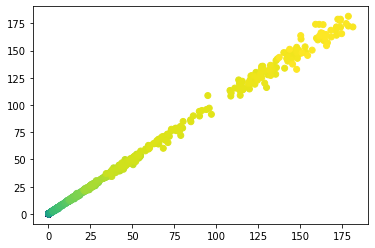

In [80]:
color = np.linspace(0,1, num=len(X))
plt.scatter(X,Y, c = color)
plt.show()

In [81]:
px.scatter(x = X,y = Y)


## AAPL a 16 días

In [83]:
df

Date
1980-12-12      0.100178
1980-12-15      0.094952
1980-12-16      0.087983
1980-12-17      0.090160
1980-12-18      0.092774
                 ...    
2022-06-15    135.429993
2022-06-16    130.059998
2022-06-17    131.559998
2022-06-21    135.869995
2022-06-22    135.699997
Name: Adj Close, Length: 10470, dtype: float64

In [84]:
aapl16_tset = []
for tao in (range(int(aapl.shape[0]/16)//1)):
    a = aapl[(16*tao)]
    aapl16_tset.append(a)
aapl16_tset
       

[0.10017842054367065,
 0.10758325457572937,
 0.10409900546073914,
 0.08580511808395386,
 0.08449854701757431,
 0.09408100694417953,
 0.09887182712554932,
 0.10888984054327011,
 0.10888984054327011,
 0.07752924412488937,
 0.08624069392681122,
 0.06751205027103424,
 0.061413805931806564,
 0.0648980662226677,
 0.06968968361616135,
 0.062720388174057,
 0.07360946387052536,
 0.062720388174057,
 0.07056072354316711,
 0.06359143555164337,
 0.06228487193584442,
 0.056187454611063004,
 0.05575191229581833,
 0.04878263548016548,
 0.04660496860742569,
 0.04442731663584709,
 0.04268519580364227,
 0.05967170372605324,
 0.06533361226320267,
 0.08232086151838303,
 0.1049700602889061,
 0.1110675260424614,
 0.10845433175563812,
 0.11498729139566422,
 0.14721892774105072,
 0.16289889812469482,
 0.15026767551898956,
 0.16376993060112,
 0.19077518582344055,
 0.2038419395685196,
 0.18554805219173431,
 0.15244616568088531,
 0.11934340745210648,
 0.12674741446971893,
 0.08667618036270142,
 0.0675120502710342

In [85]:
aapl16_embedding = []
for i in range(len(aapl16_tset)-1):
    point = (aapl16_tset[i], aapl16_tset[i+1])
    aapl16_embedding.append(point)
aapl16_embedding   

[(0.10017842054367065, 0.10758325457572937),
 (0.10758325457572937, 0.10409900546073914),
 (0.10409900546073914, 0.08580511808395386),
 (0.08580511808395386, 0.08449854701757431),
 (0.08449854701757431, 0.09408100694417953),
 (0.09408100694417953, 0.09887182712554932),
 (0.09887182712554932, 0.10888984054327011),
 (0.10888984054327011, 0.10888984054327011),
 (0.10888984054327011, 0.07752924412488937),
 (0.07752924412488937, 0.08624069392681122),
 (0.08624069392681122, 0.06751205027103424),
 (0.06751205027103424, 0.061413805931806564),
 (0.061413805931806564, 0.0648980662226677),
 (0.0648980662226677, 0.06968968361616135),
 (0.06968968361616135, 0.062720388174057),
 (0.062720388174057, 0.07360946387052536),
 (0.07360946387052536, 0.062720388174057),
 (0.062720388174057, 0.07056072354316711),
 (0.07056072354316711, 0.06359143555164337),
 (0.06359143555164337, 0.06228487193584442),
 (0.06228487193584442, 0.056187454611063004),
 (0.056187454611063004, 0.05575191229581833),
 (0.055751912295

In [86]:
X16 = []
for i in range(len(aapl16_embedding)):
    x_ate = aapl16_embedding[i][0]
    X16.append(x_ate)
X16    

[0.10017842054367065,
 0.10758325457572937,
 0.10409900546073914,
 0.08580511808395386,
 0.08449854701757431,
 0.09408100694417953,
 0.09887182712554932,
 0.10888984054327011,
 0.10888984054327011,
 0.07752924412488937,
 0.08624069392681122,
 0.06751205027103424,
 0.061413805931806564,
 0.0648980662226677,
 0.06968968361616135,
 0.062720388174057,
 0.07360946387052536,
 0.062720388174057,
 0.07056072354316711,
 0.06359143555164337,
 0.06228487193584442,
 0.056187454611063004,
 0.05575191229581833,
 0.04878263548016548,
 0.04660496860742569,
 0.04442731663584709,
 0.04268519580364227,
 0.05967170372605324,
 0.06533361226320267,
 0.08232086151838303,
 0.1049700602889061,
 0.1110675260424614,
 0.10845433175563812,
 0.11498729139566422,
 0.14721892774105072,
 0.16289889812469482,
 0.15026767551898956,
 0.16376993060112,
 0.19077518582344055,
 0.2038419395685196,
 0.18554805219173431,
 0.15244616568088531,
 0.11934340745210648,
 0.12674741446971893,
 0.08667618036270142,
 0.0675120502710342

In [87]:
Y16 = []
for i in range(len(aapl16_embedding)):
    y_ate = aapl16_embedding[i][1]
    Y16.append(y_ate)
Y16  

[0.10758325457572937,
 0.10409900546073914,
 0.08580511808395386,
 0.08449854701757431,
 0.09408100694417953,
 0.09887182712554932,
 0.10888984054327011,
 0.10888984054327011,
 0.07752924412488937,
 0.08624069392681122,
 0.06751205027103424,
 0.061413805931806564,
 0.0648980662226677,
 0.06968968361616135,
 0.062720388174057,
 0.07360946387052536,
 0.062720388174057,
 0.07056072354316711,
 0.06359143555164337,
 0.06228487193584442,
 0.056187454611063004,
 0.05575191229581833,
 0.04878263548016548,
 0.04660496860742569,
 0.04442731663584709,
 0.04268519580364227,
 0.05967170372605324,
 0.06533361226320267,
 0.08232086151838303,
 0.1049700602889061,
 0.1110675260424614,
 0.10845433175563812,
 0.11498729139566422,
 0.14721892774105072,
 0.16289889812469482,
 0.15026767551898956,
 0.16376993060112,
 0.19077518582344055,
 0.2038419395685196,
 0.18554805219173431,
 0.15244616568088531,
 0.11934340745210648,
 0.12674741446971893,
 0.08667618036270142,
 0.06751205027103424,
 0.0670765340328216

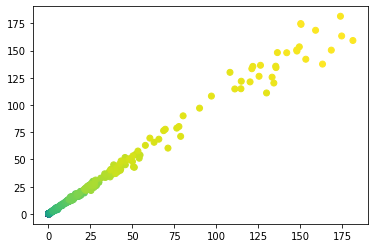

In [88]:
color = np.linspace(0,1, num=len(X16))
plt.scatter(X16,Y16, c = color)
plt.show()

## AAPL embedding en 3 dimensiones

In [96]:
apple = yf.download('AAPL')['Adj Close']
apple

[*********************100%***********************]  1 of 1 completed


Date
1980-12-12      0.100178
1980-12-15      0.094952
1980-12-16      0.087983
1980-12-17      0.090160
1980-12-18      0.092774
                 ...    
2022-06-15    135.429993
2022-06-16    130.059998
2022-06-17    131.559998
2022-06-21    135.869995
2022-06-22    135.479996
Name: Adj Close, Length: 10470, dtype: float64

In [97]:
apple_tset = []
for tao in (range(int(apple.shape[0]/4)//1)):
    a = apple[(4*tao)]
    apple_tset.append(a)
apple_tset

[0.10017846524715424,
 0.09277442842721939,
 0.11324521899223328,
 0.1189078688621521,
 0.10758323222398758,
 0.10627665370702744,
 0.11455180495977402,
 0.11411622166633606,
 0.10409897565841675,
 0.09974289685487747,
 0.0949520543217659,
 0.09103149175643921,
 0.08580515533685684,
 0.092338927090168,
 0.09016045182943344,
 0.07535160332918167,
 0.08449854701757431,
 0.09320993721485138,
 0.08624065667390823,
 0.09190335124731064,
 0.09408103674650192,
 0.09712972491979599,
 0.09582313150167465,
 0.10017846524715424,
 0.09887183457612991,
 0.09669419378042221,
 0.0949520543217659,
 0.09582313150167465,
 0.10888984799385071,
 0.11542287468910217,
 0.11019643396139145,
 0.11455180495977402,
 0.10888984799385071,
 0.10322719812393188,
 0.09800080209970474,
 0.08667618781328201,
 0.07752925157546997,
 0.08711173385381699,
 0.07883583754301071,
 0.08406301587820053,
 0.08624065667390823,
 0.08798279613256454,
 0.08101429045200348,
 0.07448054850101471,
 0.06751206517219543,
 0.070125229656

In [98]:
apple_embedding = []
for i in range(len(apple_tset)-1):
    point = (apple_tset[i], apple_tset[i+1], i)
    apple_embedding.append(point)
apple_embedding   

[(0.10017846524715424, 0.09277442842721939, 0),
 (0.09277442842721939, 0.11324521899223328, 1),
 (0.11324521899223328, 0.1189078688621521, 2),
 (0.1189078688621521, 0.10758323222398758, 3),
 (0.10758323222398758, 0.10627665370702744, 4),
 (0.10627665370702744, 0.11455180495977402, 5),
 (0.11455180495977402, 0.11411622166633606, 6),
 (0.11411622166633606, 0.10409897565841675, 7),
 (0.10409897565841675, 0.09974289685487747, 8),
 (0.09974289685487747, 0.0949520543217659, 9),
 (0.0949520543217659, 0.09103149175643921, 10),
 (0.09103149175643921, 0.08580515533685684, 11),
 (0.08580515533685684, 0.092338927090168, 12),
 (0.092338927090168, 0.09016045182943344, 13),
 (0.09016045182943344, 0.07535160332918167, 14),
 (0.07535160332918167, 0.08449854701757431, 15),
 (0.08449854701757431, 0.09320993721485138, 16),
 (0.09320993721485138, 0.08624065667390823, 17),
 (0.08624065667390823, 0.09190335124731064, 18),
 (0.09190335124731064, 0.09408103674650192, 19),
 (0.09408103674650192, 0.0971297249197

In [99]:
X3d = []
for i in range(len(apple_embedding)):
    x_ate = apple_embedding[i][0]
    X3d.append(x_ate)
X3d    

[0.10017846524715424,
 0.09277442842721939,
 0.11324521899223328,
 0.1189078688621521,
 0.10758323222398758,
 0.10627665370702744,
 0.11455180495977402,
 0.11411622166633606,
 0.10409897565841675,
 0.09974289685487747,
 0.0949520543217659,
 0.09103149175643921,
 0.08580515533685684,
 0.092338927090168,
 0.09016045182943344,
 0.07535160332918167,
 0.08449854701757431,
 0.09320993721485138,
 0.08624065667390823,
 0.09190335124731064,
 0.09408103674650192,
 0.09712972491979599,
 0.09582313150167465,
 0.10017846524715424,
 0.09887183457612991,
 0.09669419378042221,
 0.0949520543217659,
 0.09582313150167465,
 0.10888984799385071,
 0.11542287468910217,
 0.11019643396139145,
 0.11455180495977402,
 0.10888984799385071,
 0.10322719812393188,
 0.09800080209970474,
 0.08667618781328201,
 0.07752925157546997,
 0.08711173385381699,
 0.07883583754301071,
 0.08406301587820053,
 0.08624065667390823,
 0.08798279613256454,
 0.08101429045200348,
 0.07448054850101471,
 0.06751206517219543,
 0.070125229656

In [100]:
Y3d = []
for i in range(len(apple_embedding)):
    y_ate = apple_embedding[i][1]
    Y3d.append(y_ate)
Y3d    

[0.09277442842721939,
 0.11324521899223328,
 0.1189078688621521,
 0.10758323222398758,
 0.10627665370702744,
 0.11455180495977402,
 0.11411622166633606,
 0.10409897565841675,
 0.09974289685487747,
 0.0949520543217659,
 0.09103149175643921,
 0.08580515533685684,
 0.092338927090168,
 0.09016045182943344,
 0.07535160332918167,
 0.08449854701757431,
 0.09320993721485138,
 0.08624065667390823,
 0.09190335124731064,
 0.09408103674650192,
 0.09712972491979599,
 0.09582313150167465,
 0.10017846524715424,
 0.09887183457612991,
 0.09669419378042221,
 0.0949520543217659,
 0.09582313150167465,
 0.10888984799385071,
 0.11542287468910217,
 0.11019643396139145,
 0.11455180495977402,
 0.10888984799385071,
 0.10322719812393188,
 0.09800080209970474,
 0.08667618781328201,
 0.07752925157546997,
 0.08711173385381699,
 0.07883583754301071,
 0.08406301587820053,
 0.08624065667390823,
 0.08798279613256454,
 0.08101429045200348,
 0.07448054850101471,
 0.06751206517219543,
 0.07012522965669632,
 0.070996299386

In [101]:
Z3d = []
for i in range(len(apple_embedding)):
    z_ate = apple_embedding[i][2]
    Z3d.append(z_ate)
Z3d    

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [111]:
pdaapl = pd.DataFrame()
pdaapl['x'] = X3d
pdaapl['y'] = Y3d
pdaapl['z'] = Z3d
pdaapl

,x,y,z
0,0.100178,0.092774,0
1,0.092774,0.113245,1
2,0.113245,0.118908,2
3,0.118908,0.107583,3
4,0.107583,0.106277,4
...,...,...,...
2611,145.539993,137.589996,2611
2612,137.589996,143.779999,2612
2613,143.779999,151.210007,2613
2614,151.210007,147.960007,2614


In [124]:
fig = px.scatter_3d(pdaapl, x='x', y='y', z='z', color = pdaapl['z'])

In [125]:
fig.show()

## Prueba con BABA

In [5]:
baba = yf.download('BABA')['Adj Close']
baba

[*********************100%***********************]  1 of 1 completed


Date
2014-09-19     93.889999
2014-09-22     89.889999
2014-09-23     87.169998
2014-09-24     90.570000
2014-09-25     88.919998
                 ...    
2022-06-15    108.029999
2022-06-16    101.449997
2022-06-17    102.239998
2022-06-21    106.389999
2022-06-22    103.830002
Name: Adj Close, Length: 1953, dtype: float64

In [140]:
px.line(baba)

In [86]:
#numpy_array = np.array(plt.psd(baba))
#px.scatter(x = numpy_array[1], y = numpy_array[0])
# import plotly.graph_objs as go
# fig = go.Figure(data=go.Scatter(x=numpy_array[1], y=numpy_array[0], mode='lines'),
#                 layout_xaxis_range=[0,-0.2])

(array([2.28194390e+06, 1.14128046e+06, 4.35697997e+03, 1.68971366e+03,
        6.68315388e+02, 1.08538150e+03, 6.08583946e+02, 2.69350027e+02,
        3.39638713e+02, 7.46922022e+01, 8.60162375e+01, 1.04778715e+02,
        6.05728129e+01, 1.21406703e+02, 2.00083202e+02, 2.26752072e+02,
        7.70668425e+01, 7.70966362e+01, 6.98521727e+01, 7.93650339e+01,
        3.90489956e+01, 5.87231962e+01, 3.80764070e+01, 3.73506683e+01,
        3.62417345e+01, 2.26165502e+01, 1.24138339e+01, 1.55473347e+01,
        1.82779018e+01, 2.72513732e+01, 4.13366534e+01, 4.29781358e+01,
        2.48590474e+01, 2.21826110e+01, 1.81984608e+01, 2.09754195e+01,
        1.74338850e+01, 1.81058192e+01, 1.28151680e+01, 3.03247789e+00,
        4.07041819e+00, 1.46118149e+01, 2.78163478e+01, 7.84009113e+00,
        9.73201764e+00, 4.83349521e+00, 5.58874914e+00, 7.14296815e+00,
        7.01550173e+00, 5.89842732e+00, 3.79320557e+00, 2.81597144e+00,
        1.03652391e+01, 1.61107440e+01, 8.60627194e+00, 9.310365

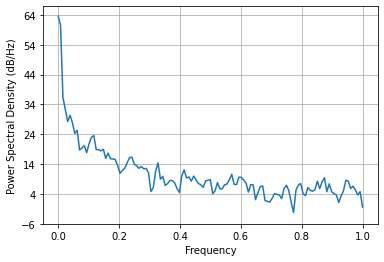

In [74]:
plt.psd(baba)

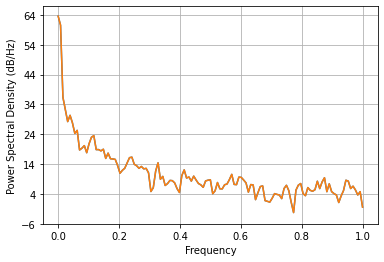

In [75]:
babax_s = plt.psd(baba)[1]
babay_s = plt.psd(baba)[0]

In [76]:
newbabay_s = babay_s[(0.1<babax_s)&(babax_s<0.25)]
newbabax_s = babax_s[(0.1<babax_s)&(babax_s<0.25)]


In [77]:
babamatrix = []
for _ in range(newbabax_s.shape[0]):
    c = (newbabax_s[_], newbabay_s[_])
    babamatrix.append(c)
pd.DataFrame(babamatrix)   


,0,1
0,0.101562,121.406703
1,0.109375,200.083202
2,0.117188,226.752072
3,0.125000,77.066842
4,0.132812,77.096636
5,0.140625,69.852173
6,0.148438,79.365034
7,0.156250,39.048996
8,0.164062,58.723196
9,0.171875,38.076407


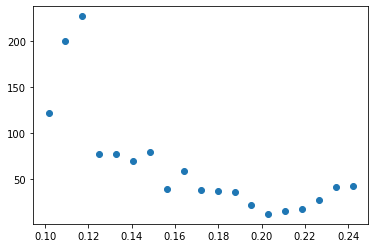

In [78]:
plt.scatter(newbabax_s, newbabay_s)

## Lagtime ideal para BABA

In [79]:
1/0.117188

8.533296924599789

In [6]:
baba_tset = []
for tao in (range(int(baba.shape[0]/8)//1)):
    a = baba[(8*tao)]
    baba_tset.append(a)
len(baba_tset)

244

In [108]:
baba_embedding = []
for i in range(len(baba_tset)-1):
    point = (baba_tset[i], baba_tset[i+1])
    baba_embedding.append(point)
baba_embedding    

[(93.88999938964844, 86.0999984741211),
 (86.0999984741211, 85.12000274658203),
 (85.12000274658203, 94.44999694824219),
 (94.44999694824219, 106.06999969482422),
 (106.06999969482422, 115.0999984741211),
 (115.0999984741211, 112.66999816894531),
 (112.66999816894531, 107.4800033569336),
 (107.4800033569336, 110.6500015258789),
 (110.6500015258789, 103.5999984741211),
 (103.5999984741211, 99.58000183105469),
 (99.58000183105469, 102.94000244140625),
 (102.94000244140625, 85.68000030517578),
 (85.68000030517578, 86.88999938964844),
 (86.88999938964844, 81.58000183105469),
 (81.58000183105469, 81.86000061035156),
 (81.86000061035156, 83.75),
 (83.75, 82.20999908447266),
 (82.20999908447266, 81.9000015258789),
 (81.9000015258789, 82.44999694824219),
 (82.44999694824219, 86.72000122070312),
 (86.72000122070312, 93.87999725341797),
 (93.87999725341797, 90.79000091552734),
 (90.79000091552734, 86.12000274658203),
 (86.12000274658203, 85.23999786376953),
 (85.23999786376953, 77.94000244140625

In [109]:
Xbaba = []
for i in range(len(baba_embedding)):
    x_bte = baba_embedding[i][0]
    Xbaba.append(x_bte)
Xbaba   

[93.88999938964844,
 86.0999984741211,
 85.12000274658203,
 94.44999694824219,
 106.06999969482422,
 115.0999984741211,
 112.66999816894531,
 107.4800033569336,
 110.6500015258789,
 103.5999984741211,
 99.58000183105469,
 102.94000244140625,
 85.68000030517578,
 86.88999938964844,
 81.58000183105469,
 81.86000061035156,
 83.75,
 82.20999908447266,
 81.9000015258789,
 82.44999694824219,
 86.72000122070312,
 93.87999725341797,
 90.79000091552734,
 86.12000274658203,
 85.23999786376953,
 77.94000244140625,
 82.66999816894531,
 79.95999908447266,
 77.33999633789062,
 68.18000030517578,
 65.54000091552734,
 64.8499984741211,
 59.2400016784668,
 66.27999877929688,
 72.6500015258789,
 82.22000122070312,
 81.43000030517578,
 79.94999694824219,
 82.58999633789062,
 82.48999786376953,
 82.13999938964844,
 70.80000305175781,
 70.72000122070312,
 65.08999633789062,
 60.88999938964844,
 66.66000366210938,
 71.06999969482422,
 76.25,
 79.02999877929688,
 77.86000061035156,
 79.88999938964844,
 75.81

In [110]:
Ybaba = []
for i in range(len(baba_embedding)):
    y_bte = baba_embedding[i][1]
    Ybaba.append(y_bte)
Ybaba    

[86.0999984741211,
 85.12000274658203,
 94.44999694824219,
 106.06999969482422,
 115.0999984741211,
 112.66999816894531,
 107.4800033569336,
 110.6500015258789,
 103.5999984741211,
 99.58000183105469,
 102.94000244140625,
 85.68000030517578,
 86.88999938964844,
 81.58000183105469,
 81.86000061035156,
 83.75,
 82.20999908447266,
 81.9000015258789,
 82.44999694824219,
 86.72000122070312,
 93.87999725341797,
 90.79000091552734,
 86.12000274658203,
 85.23999786376953,
 77.94000244140625,
 82.66999816894531,
 79.95999908447266,
 77.33999633789062,
 68.18000030517578,
 65.54000091552734,
 64.8499984741211,
 59.2400016784668,
 66.27999877929688,
 72.6500015258789,
 82.22000122070312,
 81.43000030517578,
 79.94999694824219,
 82.58999633789062,
 82.48999786376953,
 82.13999938964844,
 70.80000305175781,
 70.72000122070312,
 65.08999633789062,
 60.88999938964844,
 66.66000366210938,
 71.06999969482422,
 76.25,
 79.02999877929688,
 77.86000061035156,
 79.88999938964844,
 75.81999969482422,
 79.29

## Topological embedding BABA

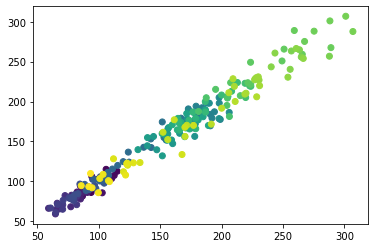

In [115]:
#color = np.linspace(0,1, num=len(Xbaba))
color = np.linspace(0,1, num=len(Xbaba))
plt.scatter(x = Xbaba,y = Ybaba, c = color)
plt.show()


## Ahora probamos con otro ticker

In [117]:
tgt = yf.download('TGT')['Adj Close']
tgt

[*********************100%***********************]  1 of 1 completed


Date
1973-02-21      0.204907
1973-02-22      0.196161
1973-02-23      0.193663
1973-02-26      0.189914
1973-02-27      0.187416
                 ...    
2022-06-14    142.699997
2022-06-15    147.440002
2022-06-16    142.889999
2022-06-17    139.300003
2022-06-21    143.994995
Name: Adj Close, Length: 12443, dtype: float64

In [118]:
fig = px.line(df)
fig.show()

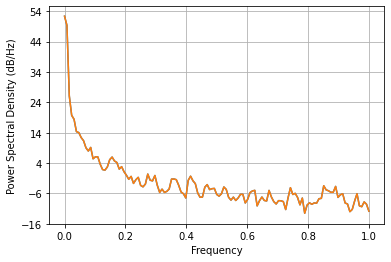

In [119]:
tgtx_s = plt.psd(tgt)[1]
tgty_s = plt.psd(tgt)[0]

In [120]:
tgtmatrix = []
for _ in range(tgtx_s.shape[0]):
    c = (tgtx_s[_], tgty_s[_])
    tgtmatrix.append(c)
pd.DataFrame(tgtmatrix).head(50)   

,0,1
0,0.000000,172846.065940
1,0.007812,86648.845692
2,0.015625,410.202836
3,0.023438,93.630416
4,0.031250,69.655481
5,0.039062,27.249727
6,0.046875,25.374814
7,0.054688,17.384939
8,0.062500,13.690341
9,0.070312,8.027679


In [121]:
newtgty_s = tgty_s[(0.1<tgtx_s)&(tgtx_s<0.2)]
newtgtx_s = tgtx_s[(0.1<tgtx_s)&(tgtx_s<0.2)]

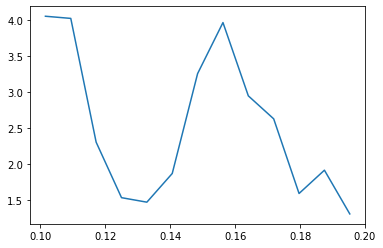

In [122]:
plt.plot(newtgtx_s, newtgty_s)

## Ventana de tiempo óptima para TGT

In [123]:
1/0.156250

6.4

## Topological embedding

In [145]:
tgt

Date
1973-02-21      0.204907
1973-02-22      0.196161
1973-02-23      0.193663
1973-02-26      0.189914
1973-02-27      0.187416
                 ...    
2022-06-14    142.699997
2022-06-15    147.440002
2022-06-16    142.889999
2022-06-17    139.300003
2022-06-21    143.994995
Name: Adj Close, Length: 12443, dtype: float64

In [138]:
tgt.tail(10)

Date
2022-06-07    155.979996
2022-06-08    156.699997
2022-06-09    154.550003
2022-06-10    149.669998
2022-06-13    144.809998
2022-06-14    142.699997
2022-06-15    147.440002
2022-06-16    142.889999
2022-06-17    139.300003
2022-06-21    143.994995
Name: Adj Close, dtype: float64

In [134]:
figtgt = px.line(tgt)
figtgt.show()

In [127]:
tgt_tset = []
for tao in (range(int(tgt.shape[0]/6)//1)):
    a = tgt[(6*tao)]
    tgt_tset.append(a)
tgt_tset

[0.2049073576927185,
 0.19366268813610077,
 0.1886647343635559,
 0.18741558492183685,
 0.17742015421390533,
 0.1724221259355545,
 0.19366268813610077,
 0.1761707067489624,
 0.17367148399353027,
 0.17742015421390533,
 0.17117279767990112,
 0.17742015421390533,
 0.167424276471138,
 0.1799187958240509,
 0.16492566466331482,
 0.1636761724948883,
 0.16242682933807373,
 0.15493035316467285,
 0.1424356997013092,
 0.13743792474269867,
 0.13993704319000244,
 0.12869183719158173,
 0.126193106174469,
 0.13119100034236908,
 0.1349390149116516,
 0.13618852198123932,
 0.14493444561958313,
 0.14618423581123352,
 0.12119527161121368,
 0.11744718253612518,
 0.11494800448417664,
 0.11369860917329788,
 0.1074514165520668,
 0.08995939791202545,
 0.09120872616767883,
 0.08995939791202545,
 0.08995939791202545,
 0.09995468705892563,
 0.09995468705892563,
 0.09620670229196548,
 0.10245390981435776,
 0.10120458900928497,
 0.09745600074529648,
 0.10245390981435776,
 0.11744718253612518,
 0.11119996011257172,
 

In [128]:
tgt_embedding = []
for i in range(len(tgt_tset)-1):
    point = (tgt_tset[i], tgt_tset[i+1])
    tgt_embedding.append(point)
tgt_embedding    

[(0.2049073576927185, 0.19366268813610077),
 (0.19366268813610077, 0.1886647343635559),
 (0.1886647343635559, 0.18741558492183685),
 (0.18741558492183685, 0.17742015421390533),
 (0.17742015421390533, 0.1724221259355545),
 (0.1724221259355545, 0.19366268813610077),
 (0.19366268813610077, 0.1761707067489624),
 (0.1761707067489624, 0.17367148399353027),
 (0.17367148399353027, 0.17742015421390533),
 (0.17742015421390533, 0.17117279767990112),
 (0.17117279767990112, 0.17742015421390533),
 (0.17742015421390533, 0.167424276471138),
 (0.167424276471138, 0.1799187958240509),
 (0.1799187958240509, 0.16492566466331482),
 (0.16492566466331482, 0.1636761724948883),
 (0.1636761724948883, 0.16242682933807373),
 (0.16242682933807373, 0.15493035316467285),
 (0.15493035316467285, 0.1424356997013092),
 (0.1424356997013092, 0.13743792474269867),
 (0.13743792474269867, 0.13993704319000244),
 (0.13993704319000244, 0.12869183719158173),
 (0.12869183719158173, 0.126193106174469),
 (0.126193106174469, 0.131191

In [131]:
Xtgt = []
for i in range(len(tgt_embedding)):
    x_tte = tgt_embedding[i][0]
    Xtgt.append(x_tte)
Xtgt  

[0.2049073576927185,
 0.19366268813610077,
 0.1886647343635559,
 0.18741558492183685,
 0.17742015421390533,
 0.1724221259355545,
 0.19366268813610077,
 0.1761707067489624,
 0.17367148399353027,
 0.17742015421390533,
 0.17117279767990112,
 0.17742015421390533,
 0.167424276471138,
 0.1799187958240509,
 0.16492566466331482,
 0.1636761724948883,
 0.16242682933807373,
 0.15493035316467285,
 0.1424356997013092,
 0.13743792474269867,
 0.13993704319000244,
 0.12869183719158173,
 0.126193106174469,
 0.13119100034236908,
 0.1349390149116516,
 0.13618852198123932,
 0.14493444561958313,
 0.14618423581123352,
 0.12119527161121368,
 0.11744718253612518,
 0.11494800448417664,
 0.11369860917329788,
 0.1074514165520668,
 0.08995939791202545,
 0.09120872616767883,
 0.08995939791202545,
 0.08995939791202545,
 0.09995468705892563,
 0.09995468705892563,
 0.09620670229196548,
 0.10245390981435776,
 0.10120458900928497,
 0.09745600074529648,
 0.10245390981435776,
 0.11744718253612518,
 0.11119996011257172,
 

In [132]:
Ytgt = []
for i in range(len(tgt_embedding)):
    y_tte = tgt_embedding[i][1]
    Ytgt.append(y_tte)
Ytgt    

[0.19366268813610077,
 0.1886647343635559,
 0.18741558492183685,
 0.17742015421390533,
 0.1724221259355545,
 0.19366268813610077,
 0.1761707067489624,
 0.17367148399353027,
 0.17742015421390533,
 0.17117279767990112,
 0.17742015421390533,
 0.167424276471138,
 0.1799187958240509,
 0.16492566466331482,
 0.1636761724948883,
 0.16242682933807373,
 0.15493035316467285,
 0.1424356997013092,
 0.13743792474269867,
 0.13993704319000244,
 0.12869183719158173,
 0.126193106174469,
 0.13119100034236908,
 0.1349390149116516,
 0.13618852198123932,
 0.14493444561958313,
 0.14618423581123352,
 0.12119527161121368,
 0.11744718253612518,
 0.11494800448417664,
 0.11369860917329788,
 0.1074514165520668,
 0.08995939791202545,
 0.09120872616767883,
 0.08995939791202545,
 0.08995939791202545,
 0.09995468705892563,
 0.09995468705892563,
 0.09620670229196548,
 0.10245390981435776,
 0.10120458900928497,
 0.09745600074529648,
 0.10245390981435776,
 0.11744718253612518,
 0.11119996011257172,
 0.1049526035785675,
 

## Topoloigical embedding TGT

In [137]:
#color = np.linspace(0,1, num=len(Xbaba))
color = np.linspace(0,1, num=len(Xtgt))
px.scatter(x = Xtgt,y = Ytgt)



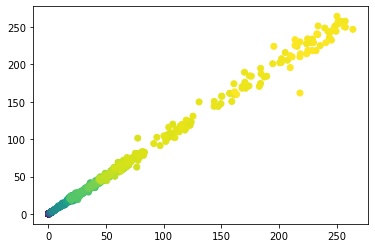

In [141]:
color = np.linspace(0,1, num=len(Xtgt))
plt.scatter(x = Xtgt,y = Ytgt, c = color)
plt.show()

## Target a 4 días de lag time

In [56]:
tgt = yf.download('TGT')['Adj Close']
tgt

[*********************100%***********************]  1 of 1 completed


Date
1973-02-21      0.204907
1973-02-22      0.196161
1973-02-23      0.193663
1973-02-26      0.189914
1973-02-27      0.187415
                 ...    
2022-06-15    147.440002
2022-06-16    142.889999
2022-06-17    139.300003
2022-06-21    144.699997
2022-06-22    140.970001
Name: Adj Close, Length: 12444, dtype: float64

In [89]:
tgt4_tset = []
for tao in (range(int(tgt.shape[0]/4)//1)):
    a = tgt[(4*tao)]
    tgt4_tset.append(a)
tgt4_tset

[0.20490731298923492,
 0.18741543591022491,
 0.19116398692131042,
 0.1886647641658783,
 0.18741543591022491,
 0.1861659586429596,
 0.17742015421390533,
 0.16617487370967865,
 0.19241325557231903,
 0.19366267323493958,
 0.1861659586429596,
 0.1686740666627884,
 0.1736716628074646,
 0.17866945266723633,
 0.1674242913722992,
 0.17117296159267426,
 0.1686740666627884,
 0.17242226004600525,
 0.1674242913722992,
 0.174920916557312,
 0.16992349922657013,
 0.16492554545402527,
 0.16492554545402527,
 0.1636762022972107,
 0.1624268889427185,
 0.1561795026063919,
 0.1586783230304718,
 0.1424357146024704,
 0.13993707299232483,
 0.14118637144565582,
 0.13993707299232483,
 0.13244041800498962,
 0.11619780957698822,
 0.12619318068027496,
 0.12369444221258163,
 0.1349390596151352,
 0.1349390596151352,
 0.1349390596151352,
 0.14493440091609955,
 0.14493440091609955,
 0.14118637144565582,
 0.12994125485420227,
 0.12119516730308533,
 0.11869648098945618,
 0.11744716763496399,
 0.11494798213243484,
 0.119

In [90]:
tgt4_embedding = []
for i in range(len(tgt4_tset)-1):
    point = (tgt4_tset[i], tgt4_tset[i+1])
    tgt4_embedding.append(point)
tgt4_embedding   

[(0.20490731298923492, 0.18741543591022491),
 (0.18741543591022491, 0.19116398692131042),
 (0.19116398692131042, 0.1886647641658783),
 (0.1886647641658783, 0.18741543591022491),
 (0.18741543591022491, 0.1861659586429596),
 (0.1861659586429596, 0.17742015421390533),
 (0.17742015421390533, 0.16617487370967865),
 (0.16617487370967865, 0.19241325557231903),
 (0.19241325557231903, 0.19366267323493958),
 (0.19366267323493958, 0.1861659586429596),
 (0.1861659586429596, 0.1686740666627884),
 (0.1686740666627884, 0.1736716628074646),
 (0.1736716628074646, 0.17866945266723633),
 (0.17866945266723633, 0.1674242913722992),
 (0.1674242913722992, 0.17117296159267426),
 (0.17117296159267426, 0.1686740666627884),
 (0.1686740666627884, 0.17242226004600525),
 (0.17242226004600525, 0.1674242913722992),
 (0.1674242913722992, 0.174920916557312),
 (0.174920916557312, 0.16992349922657013),
 (0.16992349922657013, 0.16492554545402527),
 (0.16492554545402527, 0.16492554545402527),
 (0.16492554545402527, 0.16367

In [91]:
Xtgt4 = []
for i in range(len(tgt4_embedding)):
    x_tte = tgt4_embedding[i][0]
    Xtgt4.append(x_tte)
Xtgt4 

[0.20490731298923492,
 0.18741543591022491,
 0.19116398692131042,
 0.1886647641658783,
 0.18741543591022491,
 0.1861659586429596,
 0.17742015421390533,
 0.16617487370967865,
 0.19241325557231903,
 0.19366267323493958,
 0.1861659586429596,
 0.1686740666627884,
 0.1736716628074646,
 0.17866945266723633,
 0.1674242913722992,
 0.17117296159267426,
 0.1686740666627884,
 0.17242226004600525,
 0.1674242913722992,
 0.174920916557312,
 0.16992349922657013,
 0.16492554545402527,
 0.16492554545402527,
 0.1636762022972107,
 0.1624268889427185,
 0.1561795026063919,
 0.1586783230304718,
 0.1424357146024704,
 0.13993707299232483,
 0.14118637144565582,
 0.13993707299232483,
 0.13244041800498962,
 0.11619780957698822,
 0.12619318068027496,
 0.12369444221258163,
 0.1349390596151352,
 0.1349390596151352,
 0.1349390596151352,
 0.14493440091609955,
 0.14493440091609955,
 0.14118637144565582,
 0.12994125485420227,
 0.12119516730308533,
 0.11869648098945618,
 0.11744716763496399,
 0.11494798213243484,
 0.119

In [92]:
Ytgt4 = []
for i in range(len(tgt4_embedding)):
    y_tte = tgt4_embedding[i][1]
    Ytgt4.append(y_tte)
Ytgt4  

[0.18741543591022491,
 0.19116398692131042,
 0.1886647641658783,
 0.18741543591022491,
 0.1861659586429596,
 0.17742015421390533,
 0.16617487370967865,
 0.19241325557231903,
 0.19366267323493958,
 0.1861659586429596,
 0.1686740666627884,
 0.1736716628074646,
 0.17866945266723633,
 0.1674242913722992,
 0.17117296159267426,
 0.1686740666627884,
 0.17242226004600525,
 0.1674242913722992,
 0.174920916557312,
 0.16992349922657013,
 0.16492554545402527,
 0.16492554545402527,
 0.1636762022972107,
 0.1624268889427185,
 0.1561795026063919,
 0.1586783230304718,
 0.1424357146024704,
 0.13993707299232483,
 0.14118637144565582,
 0.13993707299232483,
 0.13244041800498962,
 0.11619780957698822,
 0.12619318068027496,
 0.12369444221258163,
 0.1349390596151352,
 0.1349390596151352,
 0.1349390596151352,
 0.14493440091609955,
 0.14493440091609955,
 0.14118637144565582,
 0.12994125485420227,
 0.12119516730308533,
 0.11869648098945618,
 0.11744716763496399,
 0.11494798213243484,
 0.11994592845439911,
 0.111

In [93]:
#color = np.linspace(0,1, num=len(Xbaba))
color = np.linspace(0,1, num=len(Xtgt4))
px.scatter(x = Xtgt4,y = Ytgt4)

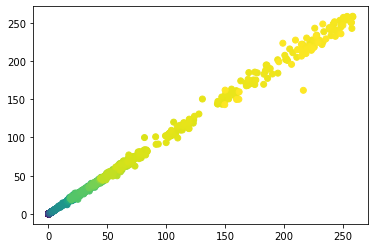

In [94]:
color = np.linspace(0,1, num=len(Xtgt4))
plt.scatter(x = Xtgt4,y = Ytgt4, c = color)
plt.show()

## Bitcoin

In [8]:
btc = yf.download('BTC-USD')['Adj Close']
btc

[*********************100%***********************]  1 of 1 completed


Date
2014-09-17      457.334015
2014-09-18      424.440002
2014-09-19      394.795990
2014-09-20      408.903992
2014-09-21      398.821014
                  ...     
2022-06-18    19017.642578
2022-06-19    20553.271484
2022-06-20    20599.537109
2022-06-21    20710.597656
2022-06-22    20696.804688
Name: Adj Close, Length: 2836, dtype: float64

<AxesSubplot:xlabel='Date'>

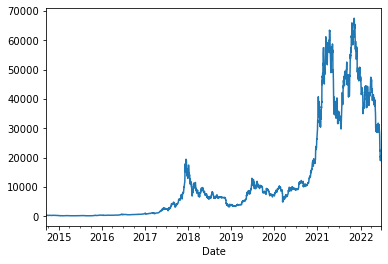

In [9]:
btc.plot()

(array([3.47712565e+10, 1.75387113e+10, 6.29480617e+08, 6.28443680e+07,
        2.08850484e+07, 3.73768350e+07, 3.42247744e+07, 1.44143938e+07,
        1.36452773e+07, 2.96553359e+07, 1.72281240e+07, 1.55210426e+07,
        8.67216792e+06, 7.79503509e+06, 3.01985917e+06, 5.95602904e+05,
        3.68963161e+06, 6.10950196e+06, 2.76783383e+06, 1.58365597e+06,
        3.10610837e+06, 1.32816747e+06, 2.43067770e+06, 2.82301367e+06,
        1.47616841e+06, 6.03313800e+05, 1.51795348e+06, 2.16042267e+06,
        1.17652592e+06, 7.82237035e+05, 2.10971717e+06, 2.90006368e+06,
        7.73251898e+05, 4.62050831e+05, 5.46024682e+05, 4.51254674e+05,
        1.02841407e+06, 4.49151589e+05, 2.38512679e+05, 2.41038393e+05,
        4.15997128e+05, 5.77090186e+05, 6.16557425e+05, 3.85325734e+05,
        3.62451533e+05, 2.90391878e+05, 2.95918739e+05, 5.74011422e+05,
        5.12055192e+05, 1.37491451e+05, 3.68079355e+05, 8.07304381e+05,
        1.21172567e+06, 6.79248531e+05, 4.73940575e+05, 4.120227

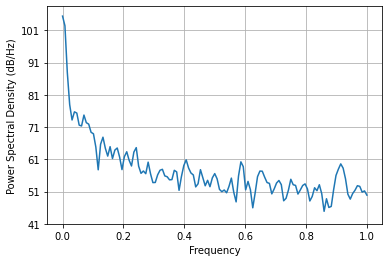

In [10]:
plt.psd(btc)

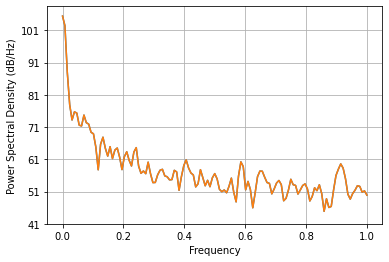

In [28]:
btcx_s = plt.psd(btc)[1]
btcy_s = plt.psd(btc)[0]

C:\Users\FELIZA~1\AppData\Local\Temp/ipykernel_12212/798815118.py:1: RuntimeWarning: divide by zero encountered in log
  plt.plot(np.log(btcx_s), np.log(btcy_s))


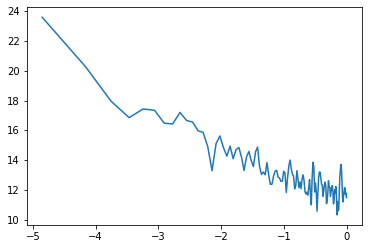

In [33]:
plt.plot(np.log(btcx_s), np.log(btcy_s))

In [44]:
newbtcy_s = btcy_s[(0.04<btcx_s)&(btcx_s<0.19)]
newbtcx_s = btcx_s[(0.04<btcx_s)&(btcx_s<0.19)]


In [45]:
btcmatrix = []
for _ in range(newbtcx_s.shape[0]):
    c = (newbtcx_s[_], newbtcy_s[_])
    btcmatrix.append(c)
pd.DataFrame(btcmatrix)   


,0,1
0,0.046875,3.422477e+07
1,0.054688,1.441439e+07
2,0.062500,1.364528e+07
3,0.070312,2.965534e+07
4,0.078125,1.722812e+07
5,0.085938,1.552104e+07
6,0.093750,8.672168e+06
7,0.101562,7.795035e+06
8,0.109375,3.019859e+06
9,0.117188,5.956029e+05


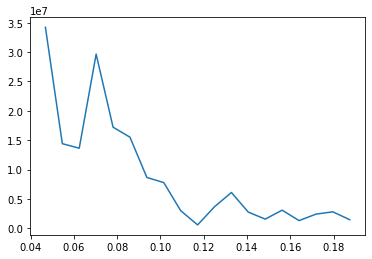

In [46]:
plt.plot(newbtcx_s, newbtcy_s)

## Ventana de tiempo ideal para BTC

In [47]:
1/0.070312

14.222323358743884

## Topological embedding

In [48]:
btc_tset = []
for tao in (range(int(btc.shape[0]/14)//1)):
    a = btc[(14*tao)]
    btc_tset.append(a)
btc_tset

[457.3340148925781,
 383.614990234375,
 394.77301025390625,
 335.59100341796875,
 423.5610046386719,
 368.3699951171875,
 346.364990234375,
 322.53399658203125,
 294.3370056152344,
 226.89700317382812,
 226.85299682617188,
 236.3260040283203,
 273.0920104980469,
 256.29901123046875,
 247.27200317382812,
 223.83299255371094,
 225.80799865722656,
 236.3769989013672,
 237.2830047607422,
 228.80299377441406,
 240.51499938964844,
 270.7850036621094,
 277.22198486328125,
 281.8819885253906,
 226.6840057373047,
 229.28399658203125,
 229.09100341796875,
 236.05999755859375,
 251.98899841308594,
 304.6180114746094,
 311.0840148925781,
 328.20599365234375,
 417.56298828125,
 442.4010009765625,
 429.1050109863281,
 420.2300109863281,
 369.9490051269531,
 416.3219909667969,
 423.989013671875,
 417.010986328125,
 414.8160095214844,
 423.7340087890625,
 444.68701171875,
 452.7279968261719,
 449.5989990234375,
 581.64501953125,
 596.1160278320312,
 677.3309936523438,
 665.6849975585938,
 566.35498046

In [49]:
btc_embedding = []
for i in range(len(btc_tset)-1):
    point = (btc_tset[i], btc_tset[i+1])
    btc_embedding.append(point)
btc_embedding    

[(457.3340148925781, 383.614990234375),
 (383.614990234375, 394.77301025390625),
 (394.77301025390625, 335.59100341796875),
 (335.59100341796875, 423.5610046386719),
 (423.5610046386719, 368.3699951171875),
 (368.3699951171875, 346.364990234375),
 (346.364990234375, 322.53399658203125),
 (322.53399658203125, 294.3370056152344),
 (294.3370056152344, 226.89700317382812),
 (226.89700317382812, 226.85299682617188),
 (226.85299682617188, 236.3260040283203),
 (236.3260040283203, 273.0920104980469),
 (273.0920104980469, 256.29901123046875),
 (256.29901123046875, 247.27200317382812),
 (247.27200317382812, 223.83299255371094),
 (223.83299255371094, 225.80799865722656),
 (225.80799865722656, 236.3769989013672),
 (236.3769989013672, 237.2830047607422),
 (237.2830047607422, 228.80299377441406),
 (228.80299377441406, 240.51499938964844),
 (240.51499938964844, 270.7850036621094),
 (270.7850036621094, 277.22198486328125),
 (277.22198486328125, 281.8819885253906),
 (281.8819885253906, 226.684005737304

In [50]:
Xbtc = []
for i in range(len(btc_embedding)):
    x_bcte = btc_embedding[i][0]
    Xbtc.append(x_bcte)
Xbtc  

[457.3340148925781,
 383.614990234375,
 394.77301025390625,
 335.59100341796875,
 423.5610046386719,
 368.3699951171875,
 346.364990234375,
 322.53399658203125,
 294.3370056152344,
 226.89700317382812,
 226.85299682617188,
 236.3260040283203,
 273.0920104980469,
 256.29901123046875,
 247.27200317382812,
 223.83299255371094,
 225.80799865722656,
 236.3769989013672,
 237.2830047607422,
 228.80299377441406,
 240.51499938964844,
 270.7850036621094,
 277.22198486328125,
 281.8819885253906,
 226.6840057373047,
 229.28399658203125,
 229.09100341796875,
 236.05999755859375,
 251.98899841308594,
 304.6180114746094,
 311.0840148925781,
 328.20599365234375,
 417.56298828125,
 442.4010009765625,
 429.1050109863281,
 420.2300109863281,
 369.9490051269531,
 416.3219909667969,
 423.989013671875,
 417.010986328125,
 414.8160095214844,
 423.7340087890625,
 444.68701171875,
 452.7279968261719,
 449.5989990234375,
 581.64501953125,
 596.1160278320312,
 677.3309936523438,
 665.6849975585938,
 566.35498046

In [51]:
Ybtc = []
for i in range(len(btc_embedding)):
    y_bcte = btc_embedding[i][1]
    Ybtc.append(y_bcte)
Ybtc 

[383.614990234375,
 394.77301025390625,
 335.59100341796875,
 423.5610046386719,
 368.3699951171875,
 346.364990234375,
 322.53399658203125,
 294.3370056152344,
 226.89700317382812,
 226.85299682617188,
 236.3260040283203,
 273.0920104980469,
 256.29901123046875,
 247.27200317382812,
 223.83299255371094,
 225.80799865722656,
 236.3769989013672,
 237.2830047607422,
 228.80299377441406,
 240.51499938964844,
 270.7850036621094,
 277.22198486328125,
 281.8819885253906,
 226.6840057373047,
 229.28399658203125,
 229.09100341796875,
 236.05999755859375,
 251.98899841308594,
 304.6180114746094,
 311.0840148925781,
 328.20599365234375,
 417.56298828125,
 442.4010009765625,
 429.1050109863281,
 420.2300109863281,
 369.9490051269531,
 416.3219909667969,
 423.989013671875,
 417.010986328125,
 414.8160095214844,
 423.7340087890625,
 444.68701171875,
 452.7279968261719,
 449.5989990234375,
 581.64501953125,
 596.1160278320312,
 677.3309936523438,
 665.6849975585938,
 566.35498046875,
 573.2160034179

In [53]:
#color = np.linspace(0,1, num=len(Xbaba))
color = np.linspace(0,1, num=len(Xbtc))
px.scatter(x = Xbtc,y = Ybtc)

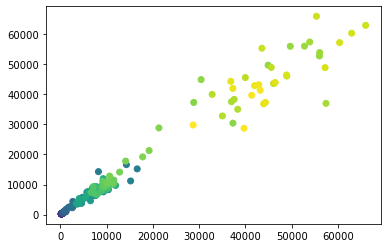

In [54]:
color = np.linspace(0,1, num=len(Xbtc))
plt.scatter(x = Xbtc,y = Ybtc, c = color)
plt.show()

## EUR/USD

In [136]:
eurusd = yf.download('EURUSD=X')['Adj Close']
eurusd

[*********************100%***********************]  1 of 1 completed


Date
2003-12-01    1.196501
2003-12-02    1.208897
2003-12-03    1.212298
2003-12-04    1.208094
2003-12-05    1.218695
                ...   
2022-06-16    1.045620
2022-06-17    1.054685
2022-06-20    1.049142
2022-06-21    1.052078
2022-06-22    1.058761
Name: Adj Close, Length: 4814, dtype: float64

(array([1.35471862e+02, 6.87974105e+01, 3.18151436e-02, 8.92250127e-03,
        5.57713337e-03, 2.54220070e-03, 2.64857300e-03, 1.54589294e-03,
        1.65687953e-03, 1.11891535e-03, 9.93559552e-04, 7.59892132e-04,
        6.29536207e-04, 4.81135423e-04, 5.75441138e-04, 3.95389693e-04,
        2.18358207e-04, 2.21465650e-04, 2.50967831e-04, 1.91190773e-04,
        2.18500143e-04, 2.53507082e-04, 2.34231980e-04, 1.79618076e-04,
        1.38474865e-04, 1.12606754e-04, 8.63550845e-05, 1.22487634e-04,
        1.44267789e-04, 1.15542576e-04, 1.14662101e-04, 1.17797832e-04,
        1.14509358e-04, 8.47782880e-05, 7.82879136e-05, 6.97864071e-05,
        1.20159267e-04, 9.84400806e-05, 7.55634687e-05, 7.54127618e-05,
        7.63360458e-05, 6.64308671e-05, 5.34575435e-05, 7.94398217e-05,
        5.27187959e-05, 5.60959899e-05, 5.37092960e-05, 4.55157823e-05,
        3.79823674e-05, 2.43203744e-05, 3.32321133e-05, 3.36391159e-05,
        4.39559913e-05, 5.13172468e-05, 4.64230724e-05, 5.952769

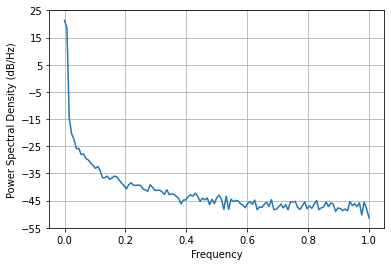

In [129]:
 plt.psd(eurusd)

In [130]:
eurusd_tset = []
for tao in (range(int(eurusd.shape[0]))):
    a = eurusd[(tao)]
    eurusd_tset.append(a)
eurusd_tset

[1.19650137424469,
 1.2088974714279175,
 1.2122975587844849,
 1.2080942392349243,
 1.2186946868896484,
 1.2220009565353394,
 1.2249947786331177,
 1.2190959453582764,
 1.2224042415618896,
 1.2278977632522583,
 1.2319974899291992,
 1.2321947813034058,
 1.2402024269104004,
 1.2422977685928345,
 1.2384973764419556,
 1.2398948669433594,
 1.2400025129318237,
 1.245298981666565,
 1.2448029518127441,
 1.243193507194519,
 1.2483927011489868,
 1.2548940181732178,
 1.2590018510818481,
 1.2581939697265625,
 1.2581939697265625,
 1.2686975002288818,
 1.2721028327941895,
 1.2640947103500366,
 1.2774981260299683,
 1.2858924865722656,
 1.2740962505340576,
 1.278592586517334,
 1.2651021480560303,
 1.260096549987793,
 1.239802598953247,
 1.235406756401062,
 1.2589067220687866,
 1.2659028768539429,
 1.2725075483322144,
 1.2583048343658447,
 1.2487980127334595,
 1.2636953592300415,
 1.2441989183425903,
 1.2410026788711548,
 1.2468050718307495,
 1.2433016300201416,
 1.2534940242767334,
 1.2539970874786377,


In [131]:
eurusd_embedding = []
for i in range(len(eurusd_tset)-1):
    point = (eurusd_tset[i], eurusd_tset[i+1])
    eurusd_embedding.append(point)
eurusd_embedding 

[(1.19650137424469, 1.2088974714279175),
 (1.2088974714279175, 1.2122975587844849),
 (1.2122975587844849, 1.2080942392349243),
 (1.2080942392349243, 1.2186946868896484),
 (1.2186946868896484, 1.2220009565353394),
 (1.2220009565353394, 1.2249947786331177),
 (1.2249947786331177, 1.2190959453582764),
 (1.2190959453582764, 1.2224042415618896),
 (1.2224042415618896, 1.2278977632522583),
 (1.2278977632522583, 1.2319974899291992),
 (1.2319974899291992, 1.2321947813034058),
 (1.2321947813034058, 1.2402024269104004),
 (1.2402024269104004, 1.2422977685928345),
 (1.2422977685928345, 1.2384973764419556),
 (1.2384973764419556, 1.2398948669433594),
 (1.2398948669433594, 1.2400025129318237),
 (1.2400025129318237, 1.245298981666565),
 (1.245298981666565, 1.2448029518127441),
 (1.2448029518127441, 1.243193507194519),
 (1.243193507194519, 1.2483927011489868),
 (1.2483927011489868, 1.2548940181732178),
 (1.2548940181732178, 1.2590018510818481),
 (1.2590018510818481, 1.2581939697265625),
 (1.2581939697265

In [132]:
Xeurusd = []
for i in range(len(eurusd_embedding)):
    x_eute = eurusd_embedding[i][0]
    Xeurusd.append(x_eute)
Xeurusd  

[1.19650137424469,
 1.2088974714279175,
 1.2122975587844849,
 1.2080942392349243,
 1.2186946868896484,
 1.2220009565353394,
 1.2249947786331177,
 1.2190959453582764,
 1.2224042415618896,
 1.2278977632522583,
 1.2319974899291992,
 1.2321947813034058,
 1.2402024269104004,
 1.2422977685928345,
 1.2384973764419556,
 1.2398948669433594,
 1.2400025129318237,
 1.245298981666565,
 1.2448029518127441,
 1.243193507194519,
 1.2483927011489868,
 1.2548940181732178,
 1.2590018510818481,
 1.2581939697265625,
 1.2581939697265625,
 1.2686975002288818,
 1.2721028327941895,
 1.2640947103500366,
 1.2774981260299683,
 1.2858924865722656,
 1.2740962505340576,
 1.278592586517334,
 1.2651021480560303,
 1.260096549987793,
 1.239802598953247,
 1.235406756401062,
 1.2589067220687866,
 1.2659028768539429,
 1.2725075483322144,
 1.2583048343658447,
 1.2487980127334595,
 1.2636953592300415,
 1.2441989183425903,
 1.2410026788711548,
 1.2468050718307495,
 1.2433016300201416,
 1.2534940242767334,
 1.2539970874786377,


In [133]:
Yeurusd = []
for i in range(len(eurusd_embedding)):
    y_eute = eurusd_embedding[i][1]
    Yeurusd.append(y_eute)
Yeurusd  

[1.2088974714279175,
 1.2122975587844849,
 1.2080942392349243,
 1.2186946868896484,
 1.2220009565353394,
 1.2249947786331177,
 1.2190959453582764,
 1.2224042415618896,
 1.2278977632522583,
 1.2319974899291992,
 1.2321947813034058,
 1.2402024269104004,
 1.2422977685928345,
 1.2384973764419556,
 1.2398948669433594,
 1.2400025129318237,
 1.245298981666565,
 1.2448029518127441,
 1.243193507194519,
 1.2483927011489868,
 1.2548940181732178,
 1.2590018510818481,
 1.2581939697265625,
 1.2581939697265625,
 1.2686975002288818,
 1.2721028327941895,
 1.2640947103500366,
 1.2774981260299683,
 1.2858924865722656,
 1.2740962505340576,
 1.278592586517334,
 1.2651021480560303,
 1.260096549987793,
 1.239802598953247,
 1.235406756401062,
 1.2589067220687866,
 1.2659028768539429,
 1.2725075483322144,
 1.2583048343658447,
 1.2487980127334595,
 1.2636953592300415,
 1.2441989183425903,
 1.2410026788711548,
 1.2468050718307495,
 1.2433016300201416,
 1.2534940242767334,
 1.2539970874786377,
 1.2571974992752075

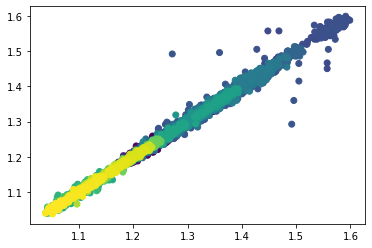

In [134]:
color = np.linspace(0,1, num=len(Xeurusd))
plt.scatter(x = Xeurusd,y = Yeurusd, c = color)
plt.show()

## Topological embedding 3d

In [137]:
eurusd

Date
2003-12-01    1.196501
2003-12-02    1.208897
2003-12-03    1.212298
2003-12-04    1.208094
2003-12-05    1.218695
                ...   
2022-06-16    1.045620
2022-06-17    1.054685
2022-06-20    1.049142
2022-06-21    1.052078
2022-06-22    1.058761
Name: Adj Close, Length: 4814, dtype: float64

In [138]:
eurusd3d_tset = []
for tao in (range(int(eurusd.shape[0]))):
    a = eurusd[(tao)]
    eurusd3d_tset.append(a)
eurusd3d_tset

[1.19650137424469,
 1.2088974714279175,
 1.2122975587844849,
 1.2080942392349243,
 1.2186946868896484,
 1.2220009565353394,
 1.2249947786331177,
 1.2190959453582764,
 1.2224042415618896,
 1.2278977632522583,
 1.2319974899291992,
 1.2321947813034058,
 1.2402024269104004,
 1.2422977685928345,
 1.2384973764419556,
 1.2398948669433594,
 1.2400025129318237,
 1.245298981666565,
 1.2448029518127441,
 1.243193507194519,
 1.2483927011489868,
 1.2548940181732178,
 1.2590018510818481,
 1.2581939697265625,
 1.2581939697265625,
 1.2686975002288818,
 1.2721028327941895,
 1.2640947103500366,
 1.2774981260299683,
 1.2858924865722656,
 1.2740962505340576,
 1.278592586517334,
 1.2651021480560303,
 1.260096549987793,
 1.239802598953247,
 1.235406756401062,
 1.2589067220687866,
 1.2659028768539429,
 1.2725075483322144,
 1.2583048343658447,
 1.2487980127334595,
 1.2636953592300415,
 1.2441989183425903,
 1.2410026788711548,
 1.2468050718307495,
 1.2433016300201416,
 1.2534940242767334,
 1.2539970874786377,


In [140]:
eurusd3d_embedding = []
for i in range(len(eurusd3d_tset)-1):
    point = (eurusd3d_tset[i], eurusd3d_tset[i+1], i)
    eurusd3d_embedding.append(point)
eurusd3d_embedding 

[(1.19650137424469, 1.2088974714279175, 0),
 (1.2088974714279175, 1.2122975587844849, 1),
 (1.2122975587844849, 1.2080942392349243, 2),
 (1.2080942392349243, 1.2186946868896484, 3),
 (1.2186946868896484, 1.2220009565353394, 4),
 (1.2220009565353394, 1.2249947786331177, 5),
 (1.2249947786331177, 1.2190959453582764, 6),
 (1.2190959453582764, 1.2224042415618896, 7),
 (1.2224042415618896, 1.2278977632522583, 8),
 (1.2278977632522583, 1.2319974899291992, 9),
 (1.2319974899291992, 1.2321947813034058, 10),
 (1.2321947813034058, 1.2402024269104004, 11),
 (1.2402024269104004, 1.2422977685928345, 12),
 (1.2422977685928345, 1.2384973764419556, 13),
 (1.2384973764419556, 1.2398948669433594, 14),
 (1.2398948669433594, 1.2400025129318237, 15),
 (1.2400025129318237, 1.245298981666565, 16),
 (1.245298981666565, 1.2448029518127441, 17),
 (1.2448029518127441, 1.243193507194519, 18),
 (1.243193507194519, 1.2483927011489868, 19),
 (1.2483927011489868, 1.2548940181732178, 20),
 (1.2548940181732178, 1.25900

In [141]:
Xeurusd3d = []
for i in range(len(eurusd3d_embedding)):
    x_eute = eurusd3d_embedding[i][0]
    Xeurusd3d.append(x_eute)
Xeurusd3d    

[1.19650137424469,
 1.2088974714279175,
 1.2122975587844849,
 1.2080942392349243,
 1.2186946868896484,
 1.2220009565353394,
 1.2249947786331177,
 1.2190959453582764,
 1.2224042415618896,
 1.2278977632522583,
 1.2319974899291992,
 1.2321947813034058,
 1.2402024269104004,
 1.2422977685928345,
 1.2384973764419556,
 1.2398948669433594,
 1.2400025129318237,
 1.245298981666565,
 1.2448029518127441,
 1.243193507194519,
 1.2483927011489868,
 1.2548940181732178,
 1.2590018510818481,
 1.2581939697265625,
 1.2581939697265625,
 1.2686975002288818,
 1.2721028327941895,
 1.2640947103500366,
 1.2774981260299683,
 1.2858924865722656,
 1.2740962505340576,
 1.278592586517334,
 1.2651021480560303,
 1.260096549987793,
 1.239802598953247,
 1.235406756401062,
 1.2589067220687866,
 1.2659028768539429,
 1.2725075483322144,
 1.2583048343658447,
 1.2487980127334595,
 1.2636953592300415,
 1.2441989183425903,
 1.2410026788711548,
 1.2468050718307495,
 1.2433016300201416,
 1.2534940242767334,
 1.2539970874786377,


In [142]:
Yeurusd3d = []
for i in range(len(eurusd3d_embedding)):
    y_eute = eurusd3d_embedding[i][1]
    Yeurusd3d.append(y_eute)
Yeurusd3d    

[1.2088974714279175,
 1.2122975587844849,
 1.2080942392349243,
 1.2186946868896484,
 1.2220009565353394,
 1.2249947786331177,
 1.2190959453582764,
 1.2224042415618896,
 1.2278977632522583,
 1.2319974899291992,
 1.2321947813034058,
 1.2402024269104004,
 1.2422977685928345,
 1.2384973764419556,
 1.2398948669433594,
 1.2400025129318237,
 1.245298981666565,
 1.2448029518127441,
 1.243193507194519,
 1.2483927011489868,
 1.2548940181732178,
 1.2590018510818481,
 1.2581939697265625,
 1.2581939697265625,
 1.2686975002288818,
 1.2721028327941895,
 1.2640947103500366,
 1.2774981260299683,
 1.2858924865722656,
 1.2740962505340576,
 1.278592586517334,
 1.2651021480560303,
 1.260096549987793,
 1.239802598953247,
 1.235406756401062,
 1.2589067220687866,
 1.2659028768539429,
 1.2725075483322144,
 1.2583048343658447,
 1.2487980127334595,
 1.2636953592300415,
 1.2441989183425903,
 1.2410026788711548,
 1.2468050718307495,
 1.2433016300201416,
 1.2534940242767334,
 1.2539970874786377,
 1.2571974992752075

In [143]:
Zeurusd3d = []
for i in range(len(eurusd3d_embedding)):
    z_eute = eurusd3d_embedding[i][2]
    Zeurusd3d.append(z_eute)
Zeurusd3d    

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [145]:
pdforex = pd.DataFrame()
pdforex['x'] = Xeurusd3d
pdforex['y'] = Yeurusd3d
pdforex['z'] = Zeurusd3d
pdforex

,x,y,z
0,1.196501,1.208897,0
1,1.208897,1.212298,1
2,1.212298,1.208094,2
3,1.208094,1.218695,3
4,1.218695,1.222001,4
...,...,...,...
4808,1.044059,1.045620,4808
4809,1.045620,1.054685,4809
4810,1.054685,1.049142,4810
4811,1.049142,1.052078,4811


In [147]:
fig = px.scatter_3d(pdforex, x='x', y='y', z='z', color = pdforex['z'])
fig.show()

## Fourier transformation

In [5]:
aapl = np.array(df)
aapl

array([1.00178443e-01, 9.49520841e-02, 8.79827887e-02, ...,
       1.30059998e+02, 1.31559998e+02, 1.35700897e+02])

In [6]:
fft(aapl)


array([148053.05468387    +0.j        , 110699.83124654+61343.37841322j,
        63249.81931892+66192.36209933j, ...,
        45828.68823096-54619.37644465j,  63249.81931892-66192.36209933j,
       110699.83124654-61343.37841322j])

In [7]:
x = fft(aapl).real
x.max()

148053.05468387157

In [8]:
y = fft(aapl).imag
y

array([     0.        ,  61343.37841322,  66192.36209933, ...,
       -54619.37644465, -66192.36209933, -61343.37841322])

In [9]:
# x = [fft(aapl).real for _ in fft(aapl)]
# y = [fft(aapl).imag for _ in fft(aapl)]
# plt.scatter(x, y)
# plt.ylabel('Imaginary')
# plt.xlabel('Real')
# plt.show()

In [10]:
fft(df)

array([148053.05468387    +0.j        , 110699.83124654+61343.37841322j,
        63249.81931892+66192.36209933j, ...,
        45828.68823096-54619.37644465j,  63249.81931892-66192.36209933j,
       110699.83124654-61343.37841322j])

In [11]:
x_init = fft(df).real 

In [12]:
y_init = fft(df).imag

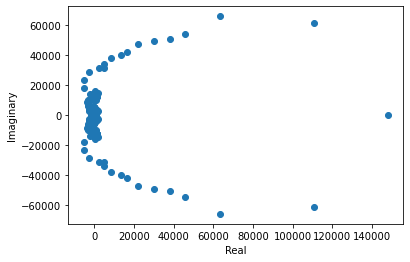

In [13]:
plt.scatter(x_init,y_init)
plt.ylabel('Imaginary')
plt.xlabel('Real')
plt.show()

In [14]:
y = y_init[(-4000<x_init)&(x_init<2500)]
x = x_init[(-4000<x_init)&(x_init<2500)]


In [15]:
x

array([ 2036.4660361 , -2685.48613773, -2129.08767052, ...,
       -2129.08767052, -2685.48613773,  2036.4660361 ])

In [16]:
x_init

array([148053.05468387, 110699.83124654,  63249.81931892, ...,
        45828.68823096,  63249.81931892, 110699.83124654])

In [17]:
y

array([ 31365.63649044,  28801.0875575 ,  13886.93952294, ...,
       -13886.93952294, -28801.0875575 , -31365.63649044])

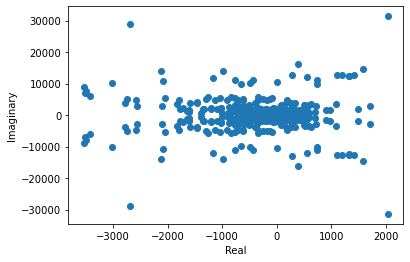

In [18]:
plt.scatter(x, y)
plt.ylabel('Imaginary')
plt.xlabel('Real')
plt.show()

In [19]:
range(x.shape[0])

range(0, 10442)

In [20]:
z = []
for _ in range(x.shape[0]):
    c = complex(x[_], y[_])
    z.append(c)
print(z)

[(2036.4660361033234+31365.63649043629j), (-2685.486137733451+28801.087557501793j), (-2129.0876705150417+13886.939522942306j), (1581.5783954273884+14583.86758074165j), (385.3455938963094+16093.818344225174j), (-994.024108724471+14054.37109427618j), (553.5266616357438+12182.134606209342j), (1412.7315929481078+12769.337461863402j), (1196.3842230601522+12570.28658854235j), (1318.4759918880684+12550.391704587371j), (1320.6120926389483+12357.61438912011j), (1110.4804987584325+12665.07856319016j), (272.6831244606809+12875.92565434303j), (-1177.0689751778389+11901.258676900623j), (-657.0846187060436+9968.906709721603j), (728.4902482057483+9972.871627100365j), (740.2701958114646+11106.41518052716j), (-441.9433494976096+11008.521718926244j), (-484.0110186255941+10121.555641042165j), (1.7056600752136077+10371.430857703293j), (-771.0407958125729+11131.72537395176j), (-2089.7754675505835+10809.42886622041j), (-3020.4488686373247+10082.574504821196j), (-3536.5098281815735+8805.61785134549j), (-3487

In [21]:
ifft(z)

array([-80.57825887+4.71844785e-14j, -78.73549434+2.36884560e-02j,
       -77.24599177+4.64806492e-02j, ...,  44.58580421+4.02424266e-02j,
        47.51223032+2.85891767e-02j,  53.17718258+1.59989515e-02j])

In [22]:
x_inv = ifft(z).real
y_inv = ifft(z).imag

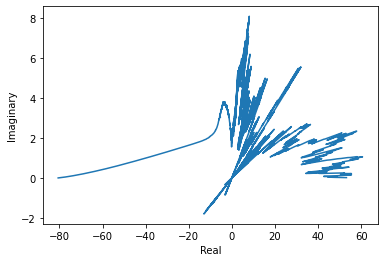

In [23]:
plt.plot(x_inv, y_inv)
plt.ylabel('Imaginary')
plt.xlabel('Real')
plt.show()

Text(0.5, 0, 'Tiempo')

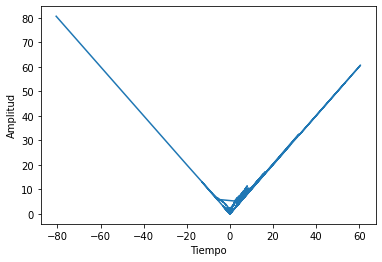

In [24]:
plt.plot(x_inv, np.absolute(ifft(z)))
plt.ylabel('Amplitud')
plt.xlabel('Tiempo')

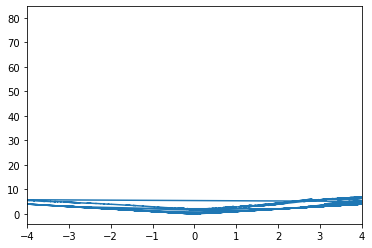

In [27]:
plt.plot(x_inv, np.absolute(ifft(z)))
plt.xlim([-4,4])
plt.show()


## Distribuciones asociadas al topological embedding